# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission, if necessary. Sections that begin with **'Implementation'** in the header indicate where you should begin your implementation for your project. Note that some sections of implementation are optional, and will be marked with **'Optional'** in the header.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

---

## Step 1: Dataset Exploration

Visualize the German Traffic Signs Dataset. This is open ended, some suggestions include: plotting traffic signs images, plotting the count of each sign, etc. Be creative!


The pickled data is a dictionary with 4 key/value pairs:

- features -> the images pixel values, (width, height, channels)
- labels -> the label of the traffic sign
- sizes -> the original width and height of the image, (width, height)
- coords -> coordinates of a bounding box around the sign in the image, (x1, y1, x2, y2)

In [1]:
#Python imports for image processing, Tensorflow, plotting etc..
import sys
import os

import tensorflow as tf

import numpy as np

from PIL import Image

import skimage.data
import skimage.transform
from   skimage.transform import resize

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg

import random
import urllib
import zipfile


%matplotlib inline
plt.style.use('ggplot')


# Bit of formatting because inline code is not styled very good by default:
from IPython.core.display import HTML
HTML("""<style> .rendered_html code { 
    padding: 2px 4px;
    color: #c7254e;
    background-color: #f9f2f4;
    border-radius: 4px;
} </style>""")

In [2]:
# Load pickled data
import pickle

# TODO: fill this in based on where you saved the training and testing data
training_file = 'train.p'
testing_file = 'test.p'

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_test, y_test = test['features'], test['labels']

In [3]:
# Helper functions

# Draw a montage. 
# Source: https://github.com/pkmital/CADL
def montage(images, saveto='montage.png'):
    """Draw all images as a montage separated by 1 pixel borders.

    Also saves the file to the destination specified by `saveto`.

    Parameters
    ----------
    images : numpy.ndarray
        Input array to create montage of.  Array should be:
        batch x height x width x channels.
    saveto : str
        Location to save the resulting montage image.

    Returns
    -------
    m : numpy.ndarray
        Montage image.
    """
    
    # Crop every image to a square
    images = [imcrop_tosquare(img_i) for img_i in images]

    # Then resize the square image to 100 x 100 pixels
    images = [resize(img_i, (100, 100)) for img_i in images]

    # Finally make our list of 3-D images a 4-D array with the first dimension the number of images:
    images = np.array(images).astype(np.float32)
    
    if isinstance(images, list):
        images = np.array(images)
    img_h = images.shape[1]
    img_w = images.shape[2]
    n_plots = int(np.ceil(np.sqrt(images.shape[0])))
    if len(images.shape) == 4 and images.shape[3] == 3:
        m = np.ones(
            (images.shape[1] * n_plots + n_plots + 1,
             images.shape[2] * n_plots + n_plots + 1, 3)) * 0.5
    else:
        m = np.ones(
            (images.shape[1] * n_plots + n_plots + 1,
             images.shape[2] * n_plots + n_plots + 1)) * 0.5
    for i in range(n_plots):
        for j in range(n_plots):
            this_filter = i * n_plots + j
            if this_filter < images.shape[0]:
                this_img = images[this_filter]
                m[1 + i + i * img_h:1 + i + (i + 1) * img_h,
                  1 + j + j * img_w:1 + j + (j + 1) * img_w] = this_img
    plt.imsave(arr=m, fname=saveto)
    return m

# Crop images to min length
# Source: https://github.com/pkmital/CADL
def imcrop_tosquare(img):
    """Make any image a square image.
    Parameters
    ----------
    img : np.ndarray
        Input image to crop, assumed at least 2d.
    Returns
    -------
    crop : np.ndarray
        Cropped image.
    """
    size = np.min(img.shape[:2])
    extra = img.shape[:2] - size
    crop = img
    for i in np.flatnonzero(extra):
        crop = np.take(crop, extra[i] // 2 + np.r_[:size], axis=i)
    return crop

# Display images with labels
def display_images_and_labels(images, labels, save_fname):
    """Display the first image of each label."""
    unique_labels = set(labels)
    fig = plt.figure(figsize=(20, 20))
    i = 1
    for label in unique_labels:
        # Pick the first image for each label.
        image = images[labels.index(label)]
        plt.subplot(8, 8, i)  # A grid of 8 rows x 8 columns
        plt.axis('off')
        plt.title("Label {0} ({1})".format(label, labels.count(label)))
        i += 1
        _ = plt.imshow(image)
    plt.show()
    
    # Now we can save it to a numpy array and save the image to a file
    fig.canvas.draw()
    data = np.fromstring(fig.canvas.tostring_rgb(), dtype=np.uint8, sep='')
    data = data.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    plt.imsave(arr=data, fname=save_fname)

# Display images of same class
def display_label_images(images, label, save_fname):
    """Display images of a specific label."""
    limit = 24  # show a max of 24 images
    fig = plt.figure(figsize=(15, 5))
    i = 1

    start = labels.index(label)
    end = start + labels[start:].index(label+1)
    for image in images[start:end][:limit]:
        plt.subplot(3, 8, i)  # 3 rows, 8 per row
        plt.axis('off')
        i += 1
        plt.imshow(image)
    plt.show()   
    
    # Now we can save it to a numpy array and save the image to a file
    fig.canvas.draw()
    data = np.fromstring(fig.canvas.tostring_rgb(), dtype=np.uint8, sep='')
    data = data.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    plt.imsave(arr=data, fname=save_fname)


# Display sign image and draw a rectangular bounding box given by coords
def display_sign(img, coords):
    #Create figure and axes
    fig,ax = plt.subplots(1)

    # Display Image
    ax.imshow(img);

    x1 = min(coords[0],30)
    y1 = min(coords[1],30)
    x2 = min(coords[2],30)
    y2 = min(coords[3],30)

    # Create rectangular patch
    rect = patches.Rectangle((x1,y1),  # (left, top)
                             x2-x1,    # width
                             y2-y1,    # height
                             linewidth=1,
                             edgecolor='r',
                             facecolor='none')

    # Add the patch to the Axes
    ax.add_patch(rect)

    plt.show()    
    

Lets probe the dataset to understand the size, type and format of the given dataset

In [4]:
print("\nData type of train/test: ")
print("Train: ", type(train))
print("Test: ", type(test))


Data type of train/test: 
Train:  <class 'dict'>
Test:  <class 'dict'>


Ok its a dictionary..lets display all the keys

In [5]:
print("\nKeys: ")
print("Train: ",train.keys())
print("Test: ", test.keys())


Keys: 
Train:  dict_keys(['features', 'sizes', 'coords', 'labels'])
Test:  dict_keys(['features', 'sizes', 'coords', 'labels'])


Lets see what kind of data each of the keys hold. I'll assume both training and test data to hold same data format. Lets just look at the training data first.

In [6]:
print("\nType of value for each key: ")
print("Coords: ", type(train['coords']))
print("Sizes: ", type(train['sizes']))
print("Labels: ", type(train['labels']))
print("Features: ", type(train['features']))


Type of value for each key: 
Coords:  <class 'numpy.ndarray'>
Sizes:  <class 'numpy.ndarray'>
Labels:  <class 'numpy.ndarray'>
Features:  <class 'numpy.ndarray'>


Oh they are numpy arrays. Great. Lets look at the array shapes.

In [7]:
print("\nShapes and Dtype of all train arrays: ")
print("Coords: ", train['coords'].shape,train['coords'].dtype )
print("Sizes: ", train['sizes'].shape, train['sizes'].dtype)
print("Labels: ", train['labels'].shape,train['labels'].dtype  )
print("Features: ",train['features'].shape, train['features'].dtype)




Shapes and Dtype of all train arrays: 
Coords:  (39209, 4) uint8
Sizes:  (39209, 2) uint8
Labels:  (39209,) uint8
Features:  (39209, 32, 32, 3) uint8


In [8]:
print("\nShapes and Dtype of all test arrays: ")
print("Coords: ", test['coords'].shape,test['coords'].dtype )
print("Sizes: ", test['sizes'].shape, test['sizes'].dtype)
print("Labels: ", test['labels'].shape,test['labels'].dtype  )
print("Features: ",test['features'].shape, test['features'].dtype)




Shapes and Dtype of all test arrays: 
Coords:  (12630, 4) uint8
Sizes:  (12630, 2) uint8
Labels:  (12630,) uint8
Features:  (12630, 32, 32, 3) uint8


Lets look at content of these arrays

In [9]:
"""
print("\ncoords Array parameters: ")
print("Description: coordinates of a bounding box around the sign in the image, (x1, y1, x2, y2)")
#print("Flags: ",train['coords'].flags)
print("Shape: ",train['coords'].shape)
print("Strides: ",train['coords'].strides)
#print("Ndim: ",train['coords'].ndim)
#print("Data: ",train['coords'].data)
#print("Size: ",train['coords'].size)
#print("Itemsize: ",train['coords'].itemsize)
#print("Nbytes: ",train['coords'].nbytes)
#print("Base: ",train['coords'].base)
print("Example : ",train['coords'][0])
"""
print("\ncoords Array: ")
print("Example : ",train['coords'][0])

print("\nsizes Array: ")
print("Example : ",train['sizes'][0])

print("\nlabels Array: ")
print("Example : ",train['labels'][0])
print("Min Train Label : ", min(train['labels']))
print("Max Train Label : ", max(train['labels']))
print("Min Test Label : ", min(test['labels']))
print("Max Test Label : ", max(test['labels']))

print("\nfeatures Array: ")


f0 = train['features'][0]
print("Example : ")
print("f0 Type: ",type(f0))
print("f0 Shape: ",f0.shape)
print("f0 Strides: ",f0.strides)






coords Array: 
Example :  [ 5  6 24 25]

sizes Array: 
Example :  [29 30]

labels Array: 
Example :  0
Min Train Label :  0
Max Train Label :  42
Min Test Label :  0
Max Test Label :  42

features Array: 
Example : 
f0 Type:  <class 'numpy.ndarray'>
f0 Shape:  (32, 32, 3)
f0 Strides:  (96, 3, 1)


Lets now display the first image in the array

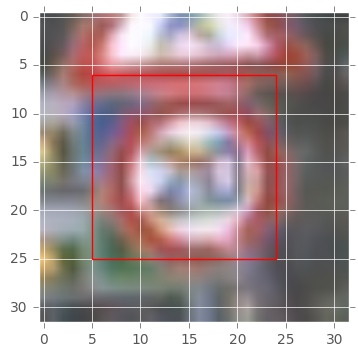

In [10]:
# Display the first Image

#Create figure and axes
fig,ax = plt.subplots(1)

# Display Image
ax.imshow(f0);

# Using coords array lets draw a bounding box around the sign in the image
x1 = train['coords'][0][0]
y1 = train['coords'][0][1]
x2 = train['coords'][0][2]
y2 = train['coords'][0][3]

# Create rectangular patch
rect = patches.Rectangle((x1,y1), x2-x1, y2-y1, linewidth=1,edgecolor='r',facecolor='none')

# Add the patch to the Axes
ax.add_patch(rect)

plt.show()

How about displaying a random sample of 100 signpost images..

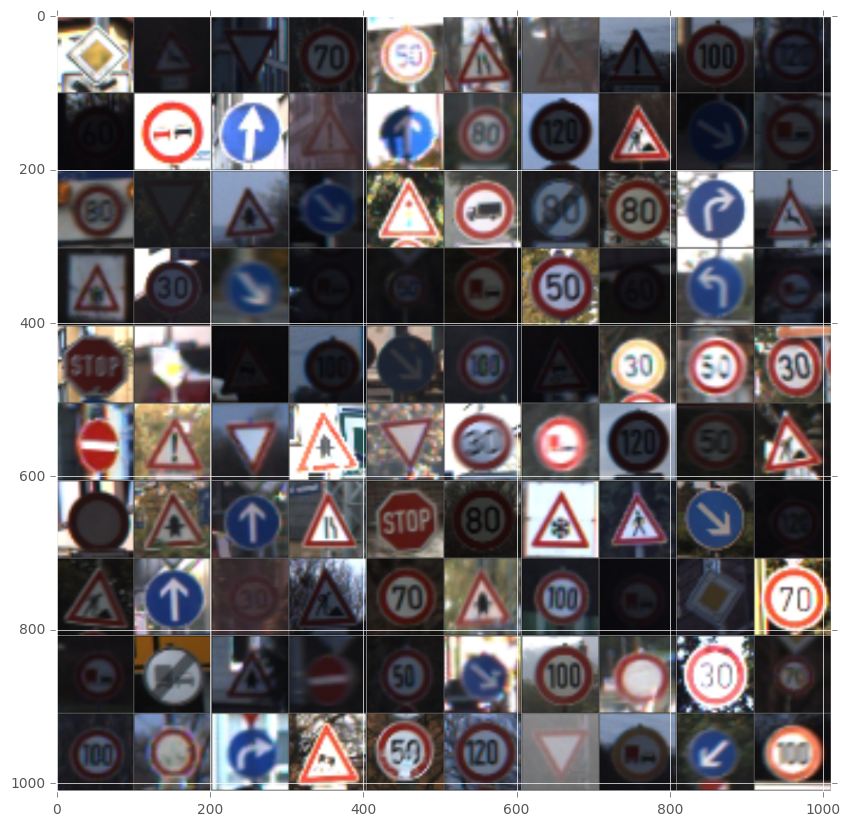

In [11]:
# Display 100 random Images

# List of random indices
indices = np.random.permutation(X_train.shape[0])
images_idx = indices[:100]
imgs100 = X_train[images_idx,:]

# Create a montage of 100 images and save it as 'dataset.png'
plt.figure(figsize=(10, 10))
plt.imshow(montage(imgs100, saveto='dataset.png'));   


In [12]:
### To start off let's do a basic data summary.

# TODO: number of training examples
n_train = len(X_train)

# TODO: number of testing examples
n_test = len(X_test)

# TODO: what's the shape of an image?
f0 = train['features'][0]
image_shape = f0.shape

# TODO: how many classes are in the dataset
n_classes = max(train['labels']) - min(train['labels']) + 1

print("Number of training examples =", n_train)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

Number of training examples = 39209
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Number of classes = 43


Next, Lets look at a sample image in each class

Unique Labels: 43
Total Images: 39209


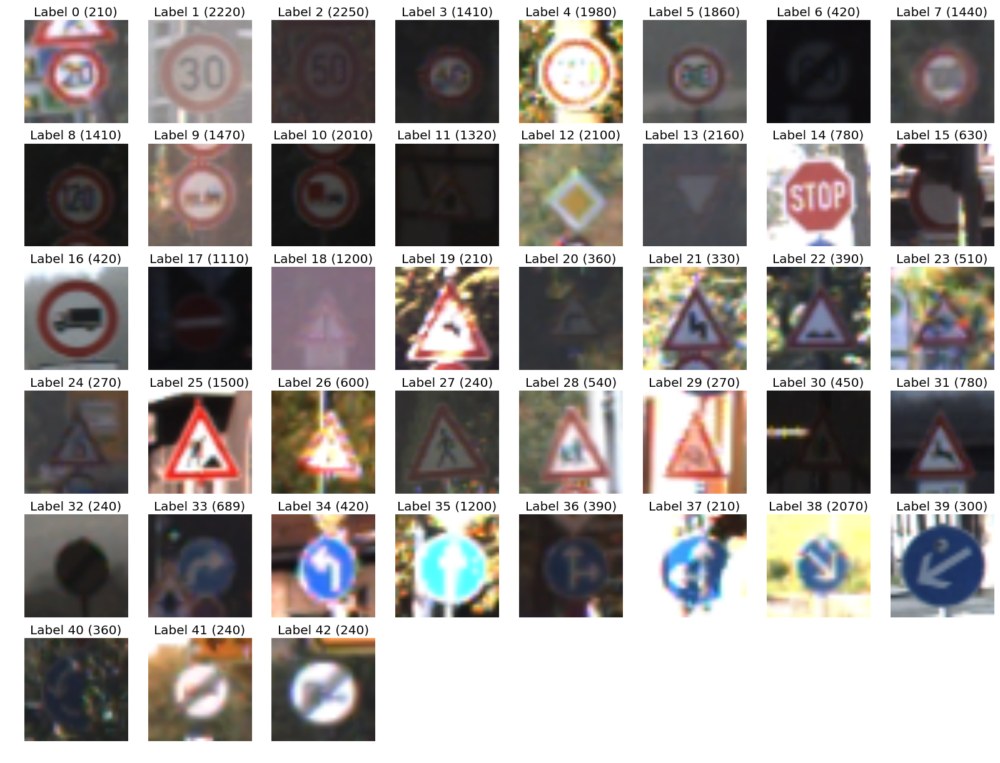

In [13]:
images = X_train
labels = train['labels'].tolist()

print("Unique Labels: {0}\nTotal Images: {1}".format(len(set(labels)), len(images)))

display_images_and_labels(images, labels, "label_images1.png")

Lets look at variations in specific class of images..

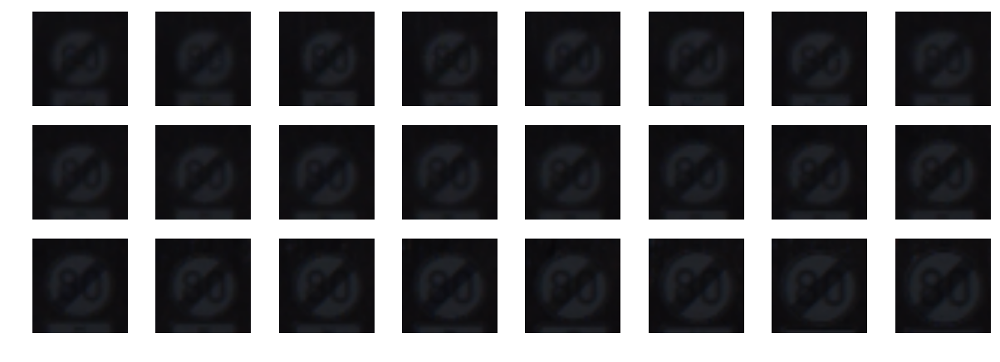

In [85]:
# Lets look at class 6
display_label_images(images, 6, "sign6.png" )

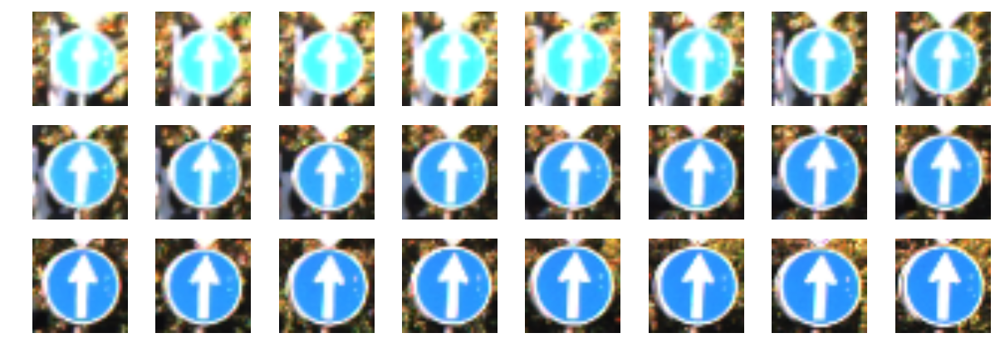

In [15]:
# and class 35
display_label_images(images, 35, "sign35.png" )

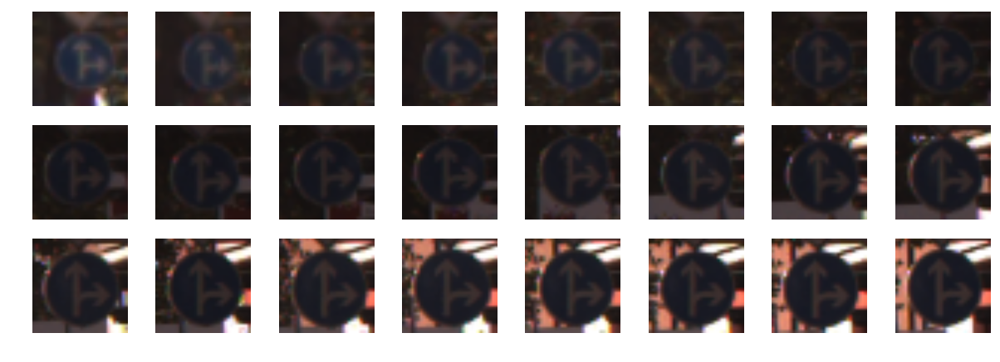

In [16]:
# and class 36
display_label_images(images, 36, "sign36.png" )

Looks like lot of repetitions with similar lighting conditions, angle etc.. but a few variations are also observed...such as scale variations, lighting variations and angles.

Lets look at the bounding coordinates for some random images..

Coords :  [ 6  6 32 32]


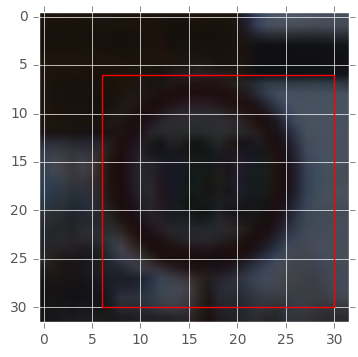

Coords :  [ 6  6 34 34]


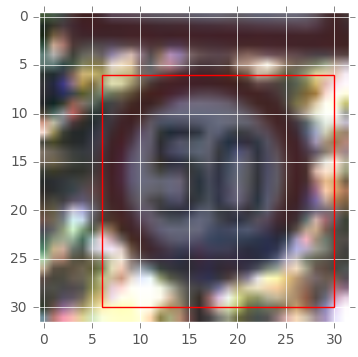

Coords :  [ 5  6 30 31]


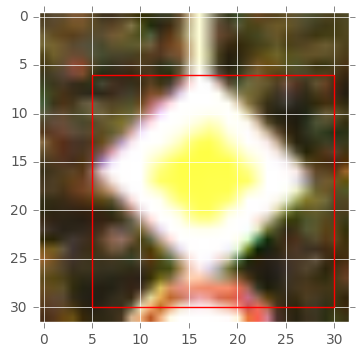

Coords :  [ 6  5 44 40]


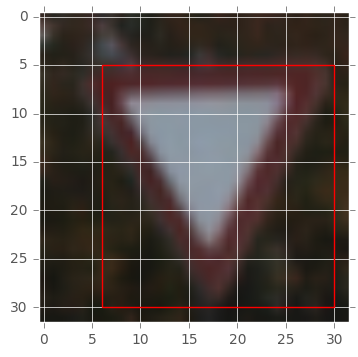

Coords :  [ 5  5 47 45]


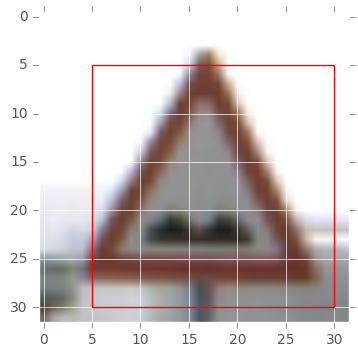

In [17]:
# Display 5 random signs
for i in range(5):
    j = round(random.random()*len(X_train))
    img = train['features'][j] 
    coords = train['coords'][j]
    print("Coords : ", coords)
    display_sign(img, coords);

Looks like the bounding box is clipping the signs on some images. Since the image size is already cropped to 32x32 we might as well use the entire image for training..bounding box info may result in clipping of signs. I am going to ignore the "coords" info as well as original image size info.

In [18]:
"""
#Look at an image by individual Channels
img = train['features'][0]
print(img.shape)
plt.figure()
plt.imshow(img)
plt.figure()
plt.imshow(img[:, :, 0])
plt.figure()
plt.imshow(img[:, :, 1])
plt.figure()
plt.imshow(img[:, :, 2])

""";

Lets look at the histogram of number of images for each class

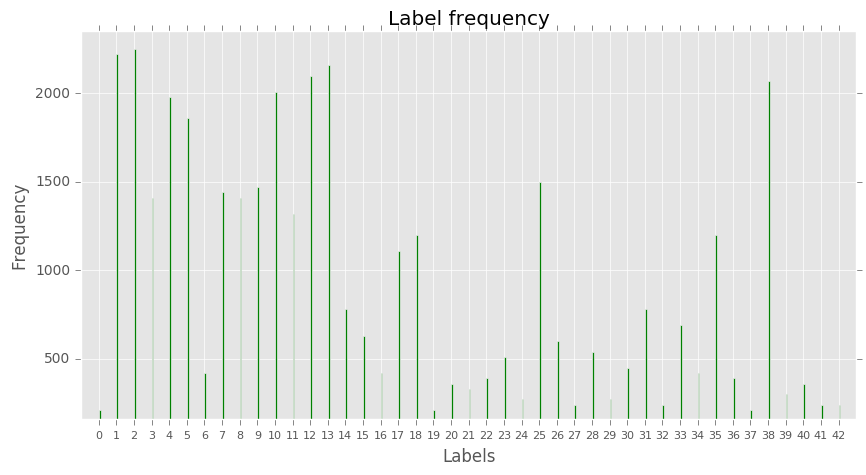

In [19]:
l = labels
x = list(set(l))
y = [l.count(i) for i in x]
#y = [i*100/max(y) for i in y]
width = 0.1

plt.figure(figsize=(10,5))
plt.xlabel('Labels')
plt.xticks(x, x, fontsize = 8)
plt.ylabel('Frequency')
#plt.yticks(y, y, fontsize = 8)
plt.title('Label frequency')
plt.axis([min(x)-1,max(x)+1,min(y)-50,max(y)+100])
plt.grid(True)

plt.bar(x, y, width, color='g')

plt.show()

Some class of images occur in larger numbers than others. Does it mean these signs occur more often than other or, was the data unevenly collected. Could this impact how our NN learns..could it generalize and assume the most likelyhood of a sign are those with higher frequency? How does the test set look...

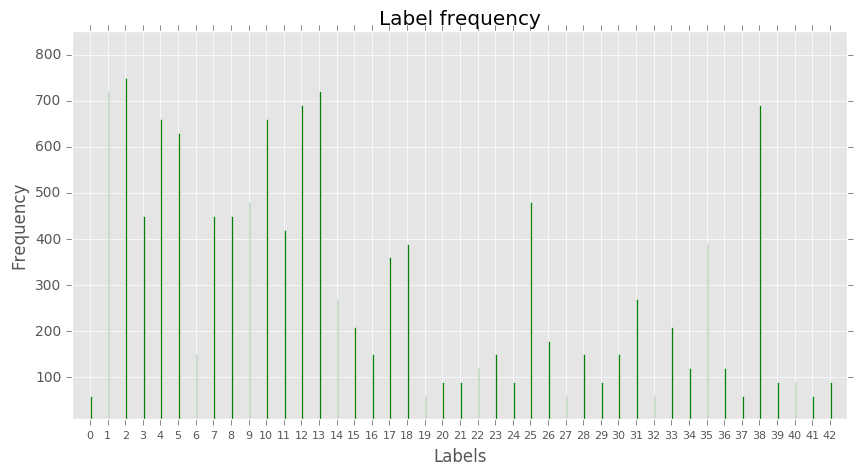

In [20]:
l = test['labels'].tolist()
x = list(set(l))
y = [l.count(i) for i in x]

#print(y)

width = 0.1
#plt.figure(figsize=(10,15))
plt.figure(figsize=(10,5))
plt.xlabel('Labels')
plt.xticks(x, x, fontsize = 8)
plt.ylabel('Frequency')
#plt.yticks(y, y, fontsize = 8)
plt.title('Label frequency')
plt.axis([min(x)-1,max(x)+1,min(y)-50,max(y)+100])
plt.grid(True)

plt.bar(x, y, width, color='g')

plt.show()

Next, lets look at the distribution of color across all images

[ 75  78  80  74  76  78  83  84  83 101]
[[[[ 75  78  80]
   [ 74  76  78]
   [ 83  84  83]
   ..., 
   [ 67  74  73]
   [ 65  69  68]
   [ 66  67  66]]

  [[ 82  83  85]
   [ 80  80  82]
   [ 87  86  83]
   ..., 
   [ 73  77  77]
   [ 75  77  75]
   [ 79  79  77]]

  [[ 79  79  81]
   [ 84  83  85]
   [ 91  88  89]
   ..., 
   [ 72  74  72]
   [ 74  75  71]
   [ 78  78  74]]

  ..., 
  [[126 128 133]
   [118 123 128]
   [108 117 120]
   ..., 
   [ 96  96  90]
   [ 99 101  94]
   [ 99 103  99]]

  [[ 90  94  98]
   [ 91  97 103]
   [ 77  87  92]
   ..., 
   [104 104  97]
   [107 111 102]
   [ 95 103  97]]

  [[ 85  84  87]
   [ 93  99 104]
   [ 69  80  85]
   ..., 
   [101 102  94]
   [ 98 101  90]
   [ 90  97  89]]]]


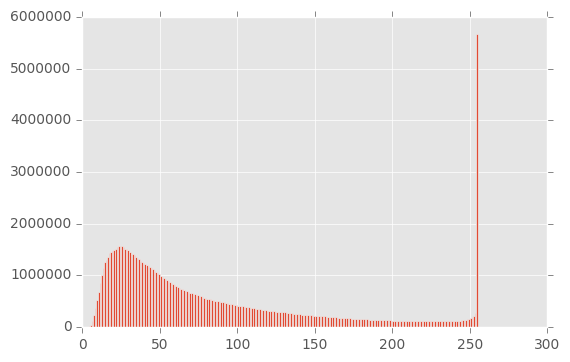

In [21]:
#Flatten the image channels across all images
flattened = images.ravel()
print(flattened[:10])
print(images[:1])

#Plot the histogram of the colors that range from 0-255 in value
plt.hist(flattened.ravel(),255);



hmm..lots of 255s... and a large range of low occuring values. Perhaps we could normalize this. Lets look at some min/max values for a few images

In [22]:
for image in images[:5]:
    print("shape: {0}, min: {1}, max: {2}".format(image.shape, image.min(), image.max()))

shape: (32, 32, 3), min: 53, max: 255
shape: (32, 32, 3), min: 53, max: 255
shape: (32, 32, 3), min: 50, max: 255
shape: (32, 32, 3), min: 37, max: 255
shape: (32, 32, 3), min: 44, max: 255


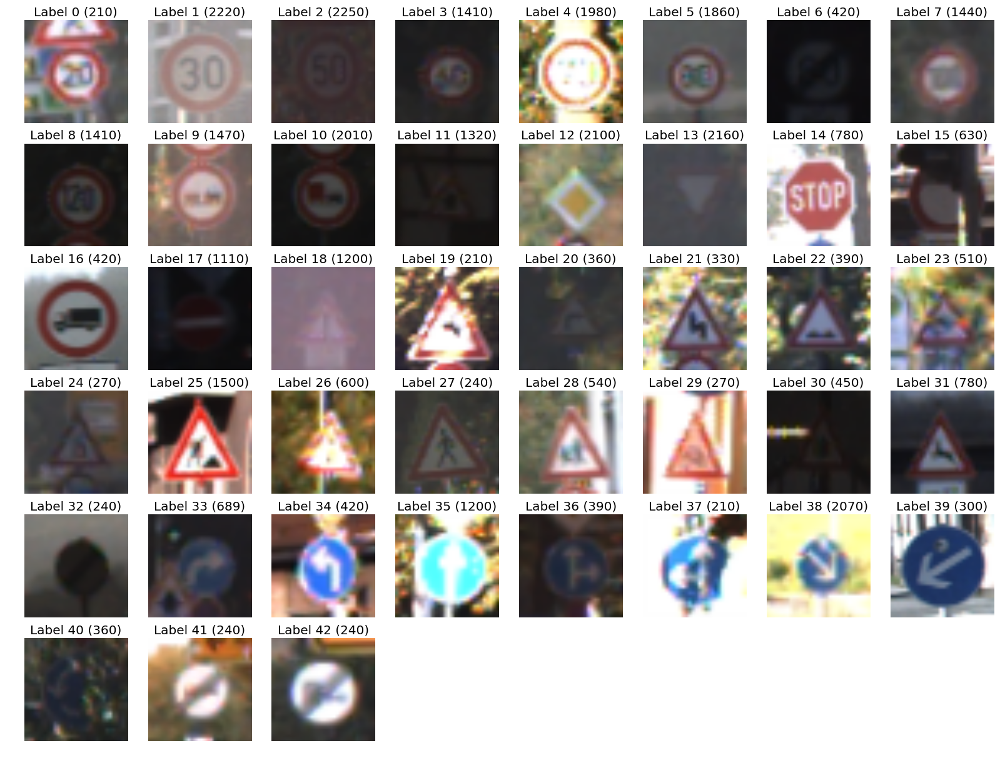

In [23]:
# Resize images results in automatic normalization. Our images are already cropped to 32x32
# Resize images
images32 = [skimage.transform.resize(image, (32, 32))
                for image in images]
display_images_and_labels(images32, labels, "resize_image_label.png")

In [24]:
for image in images32[:5]:
    print("shape: {0}, min: {1}, max: {2}".format(image.shape, image.min(), image.max()))

shape: (32, 32, 3), min: 0.20784313725490328, max: 1.0
shape: (32, 32, 3), min: 0.20784313725490242, max: 1.0
shape: (32, 32, 3), min: 0.1960784313725494, max: 1.0
shape: (32, 32, 3), min: 0.1450980392156872, max: 1.0
shape: (32, 32, 3), min: 0.1725490196078436, max: 1.0


As you can see, the resize resulted in normalizing of color values between 0, 1. this is good.. but perhaps we could subtract the mean and divide by std-deviation to get a better normalization? May be we should test with both..
Lets look at the mean and std-deviation of images


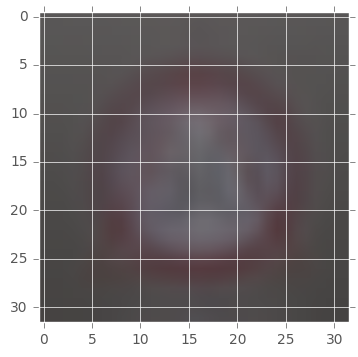

In [26]:
#Compute mean of all images and plot
mean_img = np.mean(images, axis=0)
plt.imshow(mean_img.astype(np.uint8))
plt.imsave(arr=mean_img.astype(np.uint8), fname='mean.png')

The average image has traces of circular shape of the sign, with some faint triangle super imposed. This is a good indication that there is a lot of common elements in each image. Lets look at std deviation

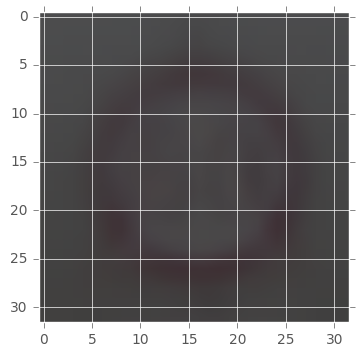

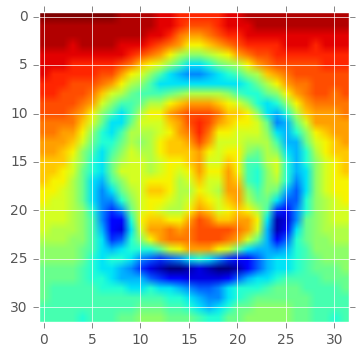

In [27]:
#Compute the std_deviation and plot
std_img = np.std(images, axis=0)
plt.imshow(std_img.astype(np.uint8))

plt.imsave(arr=std_img.astype(np.uint8), fname='std.png')

# Plot as a heatmap
plt.figure()
plt.imshow(np.mean(std_img, axis=2).astype(np.uint8))

Similar to mean, std deviation also shows areas where most changes occur.We've just shown where changes are likely to be in our dataset of images.  Or put another way, we're showing where and how much variance there is in our previous mean image representation.

Lets look at some comparison of normalized data for one of the image

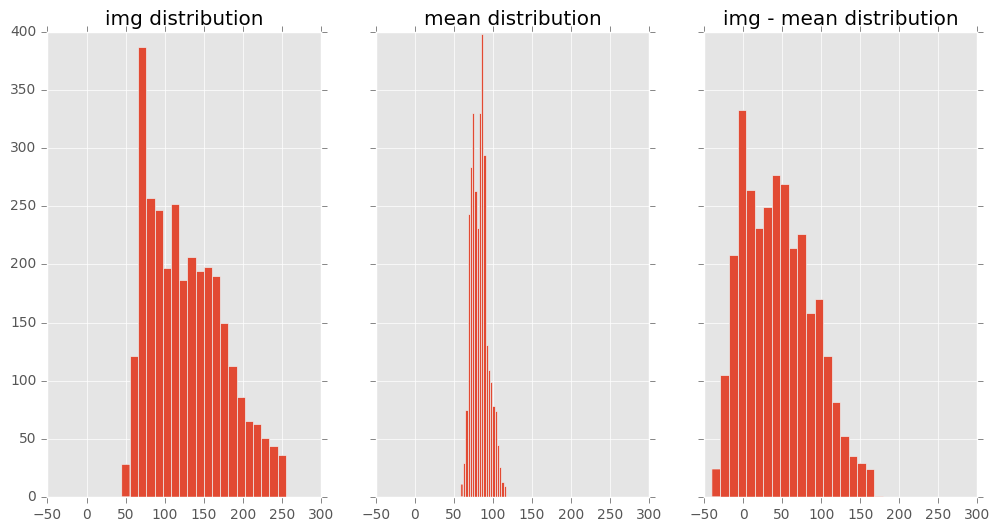

In [28]:
bins=20
fig,axs = plt.subplots(1,3, figsize=(12,6), sharey=True, sharex=True)
axs[0].hist((images[5]).ravel(), bins)
axs[0].set_title('img distribution')

axs[1].hist((mean_img).ravel(), bins)
axs[1].set_title('mean distribution')

axs[2].hist((images[5] - mean_img).ravel(), bins)
axs[2].set_title('img - mean distribution')

When we subtract an image by our mean image, we remove all of this information from it.  And that means that the rest of the information is really what is important for describing what is unique about it. What we can see from the histograms is the original image's distribution of values from 0 - 255.  The mean image's data distribution is mostly centered around the value 75-80.  When we look at the difference of the original image and the mean image as a histogram, we can see that the distribution is now centered around 0.  What we are seeing is the distribution of values that were above the mean image's intensity, and which were below it.  Let's take it one step further and complete the normalization by dividing by the standard deviation of our dataset:

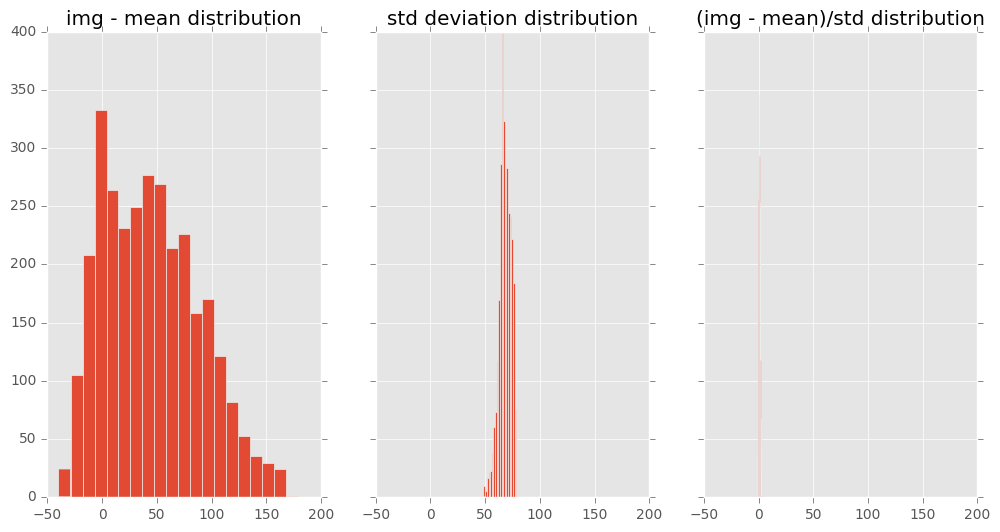

In [29]:
fig,axs = plt.subplots(1,3, figsize=(12,6), sharey=True, sharex=True)
axs[0].hist((images[5] - mean_img).ravel(), bins)
axs[0].set_title('img - mean distribution')

axs[1].hist((std_img).ravel(), bins)
axs[1].set_title('std deviation distribution')

axs[2].hist(((images[5] - mean_img)/std_img).ravel(), bins)
axs[2].set_title('(img - mean)/std distribution')

What we can see is that the data is in the range of -3 to 3, with the bulk of the data centered around -1 to 1. This is the effect of normalizing our data: most of the data will be around 0, where some deviations of it will follow between -3 to 3.

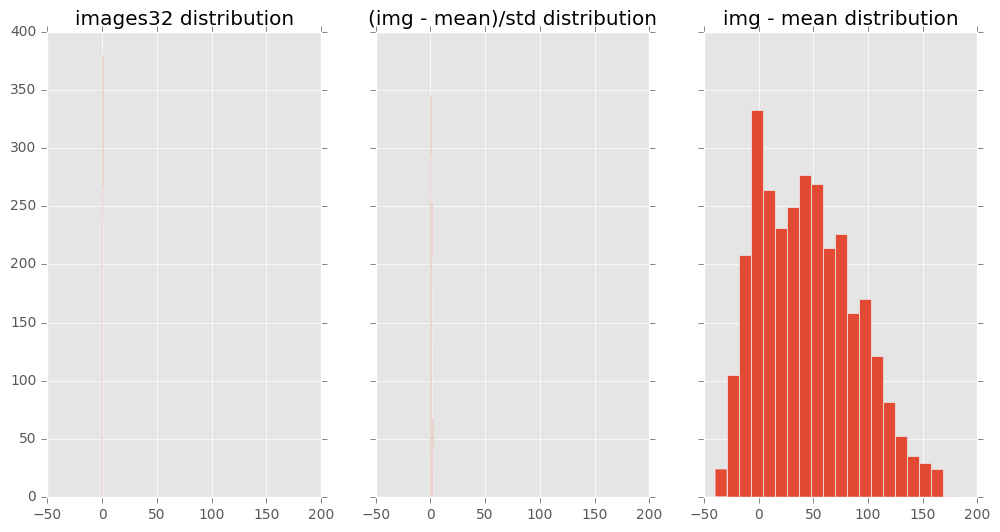

In [30]:
bins=20
fig,axs = plt.subplots(1,3, figsize=(12,6), sharey=True, sharex=True)
axs[0].hist((images32[5]).ravel(), bins)
axs[0].set_title('images32 distribution')

axs[1].hist(((images[5] - mean_img)/std_img).ravel(), bins)
axs[1].set_title('(img - mean)/std distribution')

axs[2].hist((images[5] - mean_img).ravel(), bins)
axs[2].set_title('img - mean distribution')

----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

There are various aspects to consider when thinking about this problem:

- Your model can be derived from a deep feedforward net or a deep convolutional network.
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

### Question 1 

_Describe the techniques used to preprocess the data._

**Answer:** 
   * Normalize the images by subtracting the mean and dividing by standatd deviation(Histogram Equalization)
   * Split the training set into "final training set" and "validation" set for cross validation

In [31]:
### Generate data additional (if you want to!)
### and split the data into training/validation/testing sets here.
### Feel free to use as many code cells as needed.

In [32]:
### Preprocess the data here.
# Lets split the training set for cross validation
# Randomize the indices before splitting 

NUM_TRAINING = 25000
indices = np.random.permutation(images.shape[0])
training_idx, test_idx = indices[:NUM_TRAINING], indices[NUM_TRAINING:]

#print(training_idx[0])
#plt.figure()
#plt.imshow(images[training_idx[1]])

#imgs  : Final Training set
#ctest : Cross Validation set
imgs,ctest = images[training_idx,:], images[test_idx,:]

# Labels corresponding to Final Training set and Cross Validation set
lbl = [labels[i] for i in training_idx]
clbl = [labels[i] for i in test_idx]

#plt.figure()
#plt.imshow(imgs[1])

print(imgs.shape) 
print(ctest.shape)
print(len(lbl))
print(len(clbl))



(25000, 32, 32, 3)
(14209, 32, 32, 3)
25000
14209


### Question 2

_Describe how you set up the training, validation and testing data for your model. If you generated additional data, why?_

**Answer:**
I split the training set into final training set and validation set.
Created a randomized set of indices and copied the corresponding images, labels to new sets.
I am not adding any new data to the sets consdering a large dataset. If the accuracy of test prediction go low, I may add more pictures for the failure classes, to better train the network.

Lets normalize our training set

(25000, 32, 32, 3)


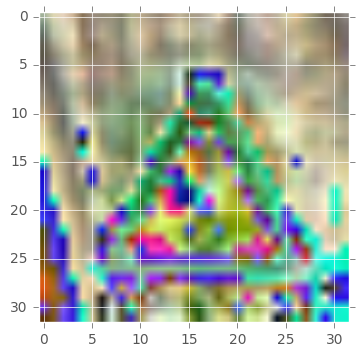

In [33]:
norm_imgs = (imgs - mean_img)/std_img
print(norm_imgs.shape)

plt.imshow(norm_imgs[0])

Normalized images appear in odd colors, to display real colors, we could apply a transform as follows:

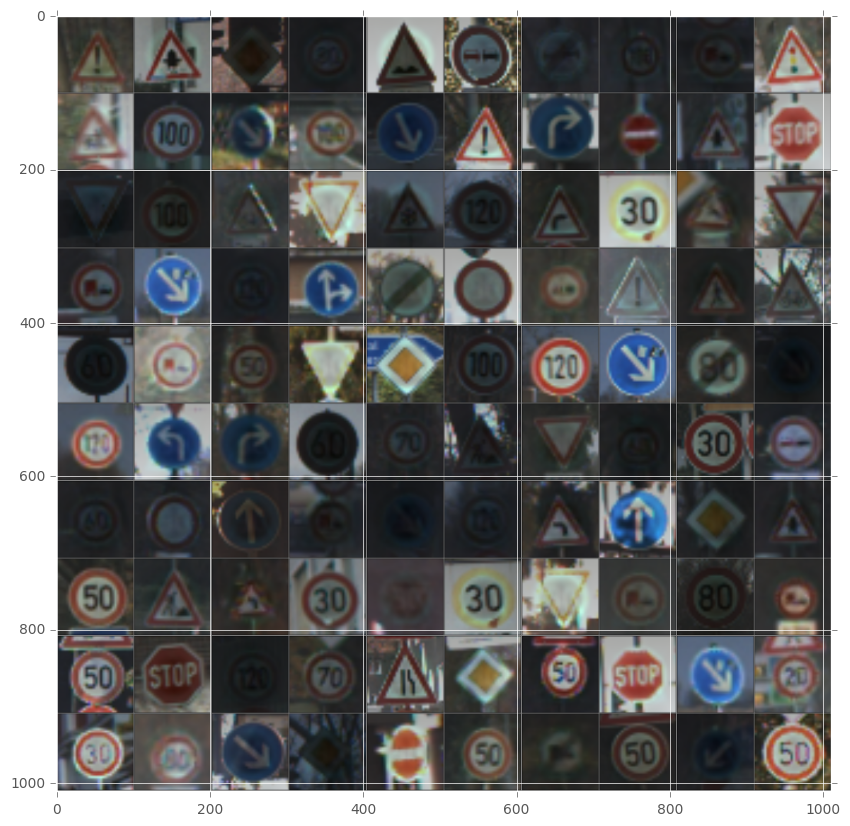

In [34]:
norm_imgs_show = (norm_imgs - np.min(norm_imgs)) / (np.max(norm_imgs) - np.min(norm_imgs))
plt.figure(figsize=(10, 10))
plt.imshow(montage(norm_imgs_show[:100], 'normalized.png'))

We could also use Tensorflow to normalize, but i found that for large data set, it errors out with :
ValueError: Cannot create a tensor proto whose content is larger than 2GB.

This could be overcome by using placeholders..according to some post on stackoverflow..i havnt tried it..will just stick with numpy normalization for now.

In [35]:
"""
# Using TF to find mean, std, norm
imgs = np.array(imgs[:1000])


# Crop every image to a square
#imgs = [imcrop_tosquare(img_i) for img_i in imgs]

# Then resize the square image to 100 x 100 pixels
imgs = [resize(img_i, (100, 100)) for img_i in imgs]

# Finally make our list of 3-D images a 4-D array with the first dimension the number of images:
imgs = np.array(imgs).astype(np.float32)

plt.figure()
plt.imshow(imgs[0])

# Now create an operation that will calculate the mean of your images
mean_img_op = tf.reduce_mean(imgs, 0, name='mean')
print("imgs: ",imgs.shape)
print("mean_img_op: ",mean_img_op.get_shape())

# And then run that operation using your session
mean_img = sess.run(mean_img_op)
print("mean_img: ",mean_img.shape)

plt.figure()
plt.imshow(mean_img)

# Create a tensorflow operation to give you the standard deviation

# First compute the difference of every image with a
# 4 dimensional mean image shaped 1 x H x W x C
#mean_img_4d = tf.reduce_mean(imgs, reduction_indices=0, keep_dims=True, name="mean_img_4d")
mean_img_4d = tf.expand_dims(mean_img,0)
print("mean_img_4d: ", mean_img_4d.get_shape().as_list())

subtraction = imgs - mean_img_4d

# Now compute the standard deviation by calculating the
# square root of the expected squared differences
std_img_op = tf.sqrt(tf.reduce_mean(subtraction * subtraction, reduction_indices=0), name="std_deviation")
print("std_img_op: ",std_img_op.get_shape())
# Now calculate the standard deviation using your session
std_img = sess.run(std_img_op)

# Then plot the resulting standard deviation image:
# Make sure the std image is the right size!
plt.figure()
std_img_show = std_img / np.max(std_img)
plt.imshow(std_img_show)


norm_imgs_op = (imgs - mean_img_4d)/std_img_op

print("norm_imgs_op: ",norm_imgs_op.get_shape())

norm_imgs = sess.run(norm_imgs_op)
print("norm_imgs: ",norm_imgs.shape)
print("min_norm_imgs: ",np.min(norm_imgs), "max_norm_imgs: ",np.max(norm_imgs))
print("imgs.dtype: ",imgs.dtype)
plt.figure()
plt.imshow(norm_imgs[0])

#plt.figure(figsize=(10, 10))
#plt.imshow(montage(norm_imgs[:100], 'normalized1.png'))

norm_imgs_show = (norm_imgs - np.min(norm_imgs)) / (np.max(norm_imgs) - np.min(norm_imgs))
plt.figure(figsize=(10, 10))
plt.imshow(montage(norm_imgs_show[:100], 'normalized2.png'))

""";

In [36]:
### Define your architecture here.
### Feel free to use as many code cells as needed.

<IPython.core.display.Javascript object>


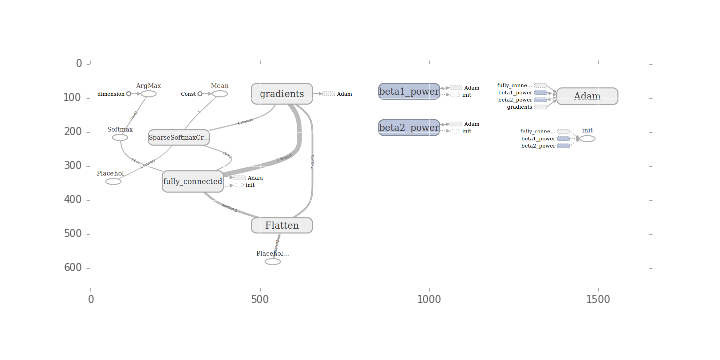

In [39]:
%matplotlib notebook

fig = plt.figure(figsize=(10,5))
graph_img=mpimg.imread('graph.png')
f=plt.imshow(graph_img)


### Question 3

_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)  For reference on how to build a deep neural network using TensorFlow, see [Deep Neural Network in TensorFlow
](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/b516a270-8600-4f93-a0a3-20dfeabe5da6/concepts/83a3a2a2-a9bd-4b7b-95b0-eb924ab14432) from the classroom._


**Answer:**
We'll stat with a fully connected model. At the input we will have a placeholder for image inputs. Inputs can be a batch of images or a single image. The output should be a predicted onehot encoded dataset indicating what label/class it belongs. The above picture gives the Tensorboard network architecture.

In [40]:
%matplotlib inline
labels_a = np.array(lbl)
images_a = np.array(norm_imgs)
print("labels: ", labels_a.shape, "\nimages: ", images_a.shape)

labels:  (25000,) 
images:  (25000, 32, 32, 3)


In [41]:
# Create a graph to hold the model.
graph = tf.Graph()


# Create model in the graph.
with graph.as_default():
    # Placeholders for inputs and labels. We're going to create placeholders for 
    # our tensorflow graph.  We're going to set the first dimension to `None`.  
    # Since we're going to pass our entire dataset in batches we'll need this 
    # to be say 100 images at a time.  But we'd also like to be able to send in 
    # only 1 image and see what the prediction of the network is.  
    # That's why we let this dimension be flexible.
    images_ph = tf.placeholder(tf.float32, [None, 32, 32, 3])
    
    # For the output, we'll have `None` again, since for every input, we'll 
    # have the same number of images that have outputs.
    labels_ph = tf.placeholder(tf.int32, [None])

    # Flatten input from: [None, height, width, channels]
    # To: [None, height * width * channels] == [None, 3072]
    images_flat = tf.contrib.layers.flatten(images_ph)

    # Fully conected layer. 
    # Generates logits of size [None, 43]
    logits = tf.contrib.layers.fully_connected(images_flat, 43, tf.nn.relu)

    # Convert logits to one-hot vector. Shape [None, 43], type float.
    predictions = tf.nn.softmax(logits)

    # Convert one-hot vector to label index (int). 
    # Shape [None], which is a 1D vector of length == batch_size.
    predicted_labels = tf.argmax(predictions, 1)

    # Define the loss function. 
    # Cross-entropy is a good choice for classification.
    loss = tf.reduce_mean(tf.nn.sparse_softmax_cross_entropy_with_logits(logits, labels_ph))

    # Create training op.
    train = tf.train.AdamOptimizer(learning_rate=0.001).minimize(loss)

    # And, finally, an initizliation op to execute before training.
    init = tf.initialize_all_variables()

print("images_flat: ", images_flat)
print("logits: ", logits)
print("loss: ", loss)
print("predictions: ", predictions)
print("predicted_labels: ", predicted_labels)

images_flat:  Tensor("Flatten/Reshape:0", shape=(?, 3072), dtype=float32)
logits:  Tensor("fully_connected/Relu:0", shape=(?, 43), dtype=float32)
loss:  Tensor("Mean:0", shape=(), dtype=float32)
predictions:  Tensor("Softmax:0", shape=(?, 43), dtype=float32)
predicted_labels:  Tensor("ArgMax:0", shape=(?,), dtype=int64)


In [42]:

# Create a session to run the graph we created.
session = tf.Session(graph=graph)

# sess.graph_def is the graph definition; that enables the Graph Visualizer.

summary_writer = tf.train.SummaryWriter('./logs', session.graph)

# First step is always to initalize our variables. 
# We don't care about the return value, though. It's None.
_ = session.run([init])



In [43]:
for i in range(201):
    _, loss_value = session.run([train, loss], 
                                feed_dict={images_ph: images_a, labels_ph: labels_a})
    if i % 10 == 0:
        print("Loss: ", loss_value)

Loss:  4.33765
Loss:  2.7576
Loss:  2.05993
Loss:  1.64526
Loss:  1.39657
Loss:  1.22517
Loss:  1.09656
Loss:  0.993888
Loss:  0.913618
Loss:  0.847812
Loss:  0.792403
Loss:  0.744769
Loss:  0.703206
Loss:  0.666316
Loss:  0.633441
Loss:  0.603908
Loss:  0.577244
Loss:  0.553091
Loss:  0.531171
Loss:  0.511152
Loss:  0.492786


In [44]:
# Let's inspect the graph
[op.name for op in graph.get_operations()]

['Placeholder',
 'Placeholder_1',
 'Flatten/Reshape/shape',
 'Flatten/Reshape',
 'fully_connected/Shape',
 'fully_connected/unpack',
 'fully_connected/weights',
 'fully_connected/weights/Initializer/random_uniform/shape',
 'fully_connected/weights/Initializer/random_uniform/min',
 'fully_connected/weights/Initializer/random_uniform/max',
 'fully_connected/weights/Initializer/random_uniform/RandomUniform',
 'fully_connected/weights/Initializer/random_uniform/sub',
 'fully_connected/weights/Initializer/random_uniform/mul',
 'fully_connected/weights/Initializer/random_uniform',
 'fully_connected/weights/Assign',
 'fully_connected/weights/read',
 'fully_connected/MatMul',
 'fully_connected/biases',
 'fully_connected/biases/Initializer/zeros',
 'fully_connected/biases/Assign',
 'fully_connected/biases/read',
 'fully_connected/BiasAdd',
 'fully_connected/Relu',
 'Softmax',
 'ArgMax/dimension',
 'ArgMax',
 'SparseSoftmaxCrossEntropyWithLogits/Shape',
 'SparseSoftmaxCrossEntropyWithLogits/Spar

In [45]:
W = graph.get_tensor_by_name('fully_connected/weights:0')

In [46]:
W_arr = np.array(W.eval(session=session))
print(W_arr.shape)

(3072, 43)


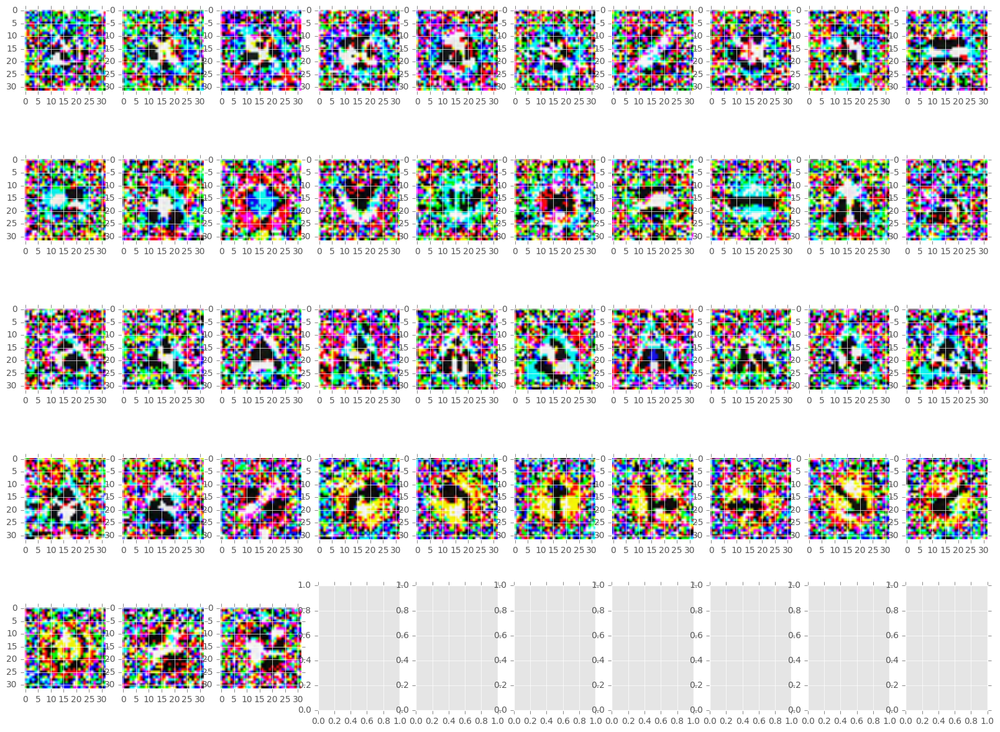

In [47]:
fig, ax = plt.subplots(5, 10, figsize=(20, 15))
r=0
c=0
for col_i in range(43):
    w_img = W_arr[:, col_i].reshape((32, 32, 3))
    ax[r][c].imshow(w_img, cmap='coolwarm')
    c = c + 1
    if(c == 10):
        r = r + 1
        c = 0
    if(r == 5):
        r = 0
        c = 0
    

So what we begin to see is that there is a weighting of all the input values, where pixels that are likely to describe that number are being weighted high, and pixels that are not likely to describe that number are being weighted low.  By summing all of these multiplications together, the network is able to begin to predict the sign in the image. Some image patterns begin to appear and hence can classify better than other classes of signs.


In [ ]:
### Train your model here.
### Feel free to use as many code cells as needed.

### Question 4

_How did you train your model? (Type of optimizer, batch size, epochs, hyperparameters, etc.)_


**Answer:**
I used AdamOptimizer to minimize the loss function given by the Cross Entropy Function: tf.nn.sparse_softmax_cross_entropy_with_logits. I used about 200 epochs to train the network.

### Question 5


_What approach did you take in coming up with a solution to this problem?_

**Answer:**
   * I figured that this is a classification problem quiet similar to MINST digit classification problem with differences in number of outputs and perhaps the input format
   * I tried to adapt NN used in the MINST classification to try solve classification of sign post.

---

## Step 3: Test a Model on New Images

Take several pictures of traffic signs that you find on the web or around you (at least five), and run them through your classifier on your computer to produce example results. The classifier might not recognize some local signs but it could prove interesting nonetheless.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [48]:
### Load the images and plot them here.
### Feel free to use as many code cells as needed.

In [49]:
# Pick 10 random images
sample_indexes = random.sample(range(len(imgs)), 10)
sample_images = [imgs[i] for i in sample_indexes]
sample_labels = [lbl[i] for i in sample_indexes]

# Run the "predicted_labels" op.
predicted = session.run([predicted_labels], 
                        feed_dict={images_ph: sample_images})[0]
print(sample_labels)
print(predicted)

[2, 11, 20, 13, 12, 7, 17, 12, 30, 6]
[ 2 11 20 13 12  7 17 12 30 41]


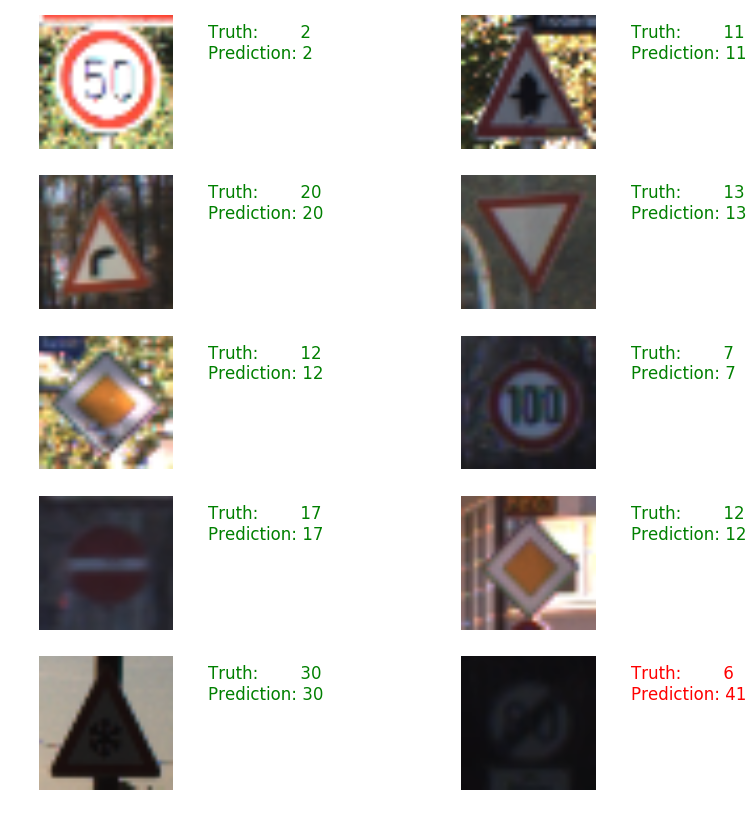

In [50]:
# Display the predictions and the ground truth visually.
fig = plt.figure(figsize=(10, 10))
for i in range(len(sample_images)):
    truth = sample_labels[i]
    prediction = predicted[i]
    plt.subplot(5, 2,1+i)
    plt.axis('off')
    color='green' if truth == prediction else 'red'
    plt.text(40, 10, "Truth:        {0}\nPrediction: {1}".format(truth, prediction), 
             fontsize=12, color=color)
    plt.imshow(sample_images[i])

Lets try predicting images downloaded from internet

[14]
[30]


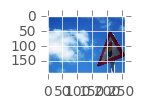

In [57]:
fig = plt.figure(figsize=(1,1))
simg=mpimg.imread('./images/s1.jpeg')
f=plt.imshow(simg)

simg = skimage.transform.resize(simg, (32, 32))
                

sample_images = [simg]

sample_labels = [14]

# Run the "predicted_labels" op.
predicted = session.run([predicted_labels], 
                        feed_dict={images_ph: sample_images})[0]

print(sample_labels)
print(predicted)

In [86]:
sample_images = []
so = []
sample_labels = [-1, 2, 25, 2, 14,  17, 14, 17,
                 28, 14,  25, 18,  35, 1,  1, 1, 
                 -1, -1,  -1, 38, -1, 1, 17, 17, 31]
for i in range(1,26):
    simg=mpimg.imread('./images/s'+str(i)+'.jpeg')
    so.append(resize(simg,(100,100)))
    simg = skimage.transform.resize(simg, (32, 32))
    sample_images.append(simg)
# Run the "predicted_labels" op.
predicted = session.run([predicted_labels], 
                        feed_dict={images_ph: sample_images})[0]

print(sample_labels)
print(predicted)


[-1, 2, 25, 2, 14, 17, 14, 17, 28, 14, 25, 18, 35, 1, 1, 1, -1, -1, -1, 38, -1, 1, 17, 17, 31]
[30 27 30 18 18  9 31 11  9 30  1 42  2 18  1 26 31 37  7 38 18 13 11 40 12]


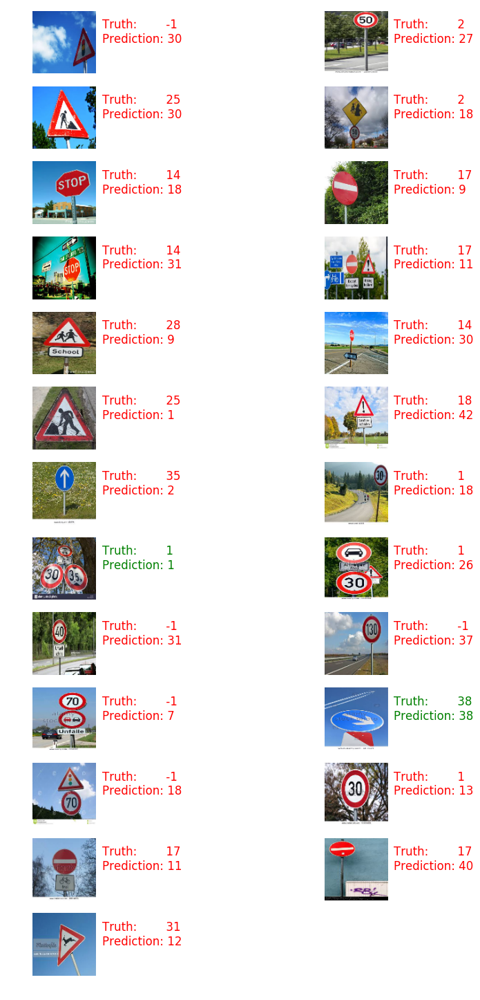

In [87]:
# Display the predictions and the ground truth visually.
fig = plt.figure(figsize=(10, 18))
for i in range(len(so)):
    truth = sample_labels[i]
    prediction = predicted[i]
    plt.subplot(13, 2,1+i)
    plt.axis('off')
    color='green' if truth == prediction else 'red'
    plt.text(110,50, "Truth:        {0}\nPrediction: {1}".format(truth, prediction), 
             fontsize=12, color=color)
    plt.imshow(so[i])

### Question 6

_Choose five candidate images of traffic signs and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult? It would be helpful to plot the images in the notebook._



**Answer:**
   Most of the test images from the internet are not being predicted correctly. The difference could be due to color variations, angle of the signs in the picture, lighting conditions, multiple signs i nthe picture causng distractions. Some options to try:
   * Use grayscale
   * Use connv-net to bring out features of the signs to make it better for prediction

In [88]:
### Run the predictions here.
### Feel free to use as many code cells as needed.

(14209, 32, 32, 3)


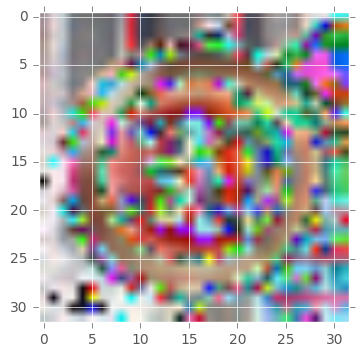

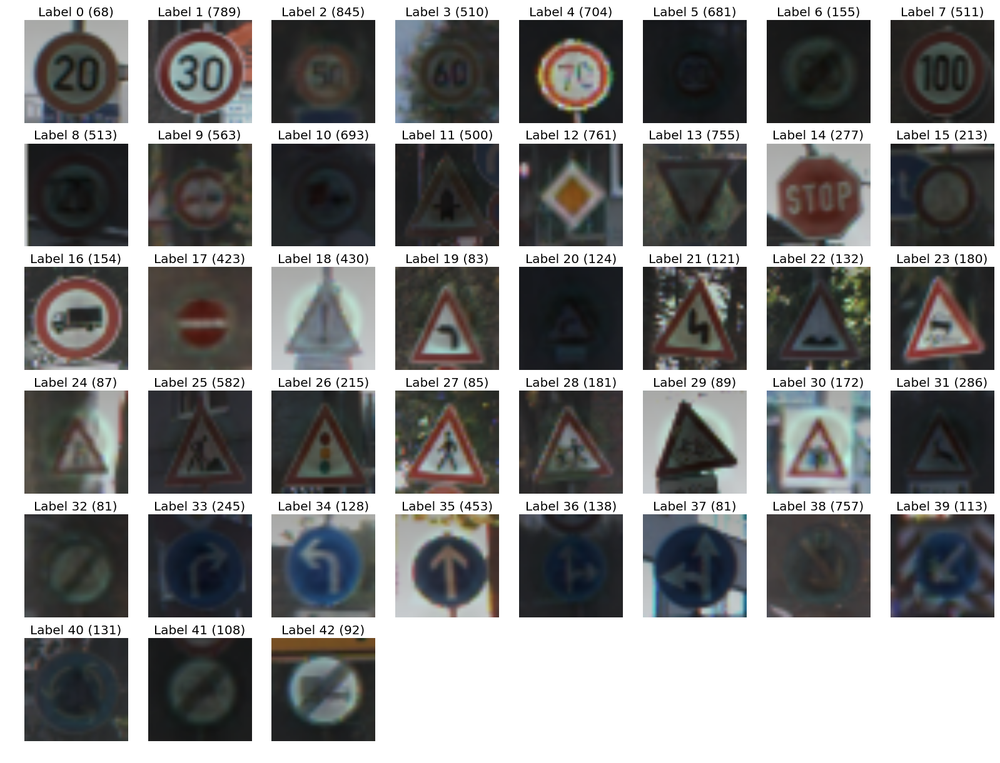

In [90]:
ctest_norm_imgs = (ctest - mean_img)/std_img
print(ctest_norm_imgs.shape)

plt.imshow(ctest_norm_imgs[0])

ctest_norm_imgs_show = (ctest_norm_imgs - np.min(ctest_norm_imgs)) / (np.max(ctest_norm_imgs) - np.min(ctest_norm_imgs))

display_images_and_labels(ctest_norm_imgs_show, clbl, "validation_test.png")

In [91]:
# Run predictions against the full test set.
predicted = session.run([predicted_labels], 
                        feed_dict={images_ph: ctest_norm_imgs})[0]
# Calculate how many matches we got.
match_count = sum([int(y == y_) for y, y_ in zip(clbl, predicted)])
accuracy = match_count / len(clbl)
print("Accuracy: {:.3f}".format(accuracy))

Accuracy: 0.883


(12630, 32, 32, 3)


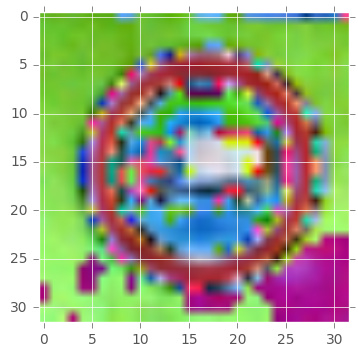

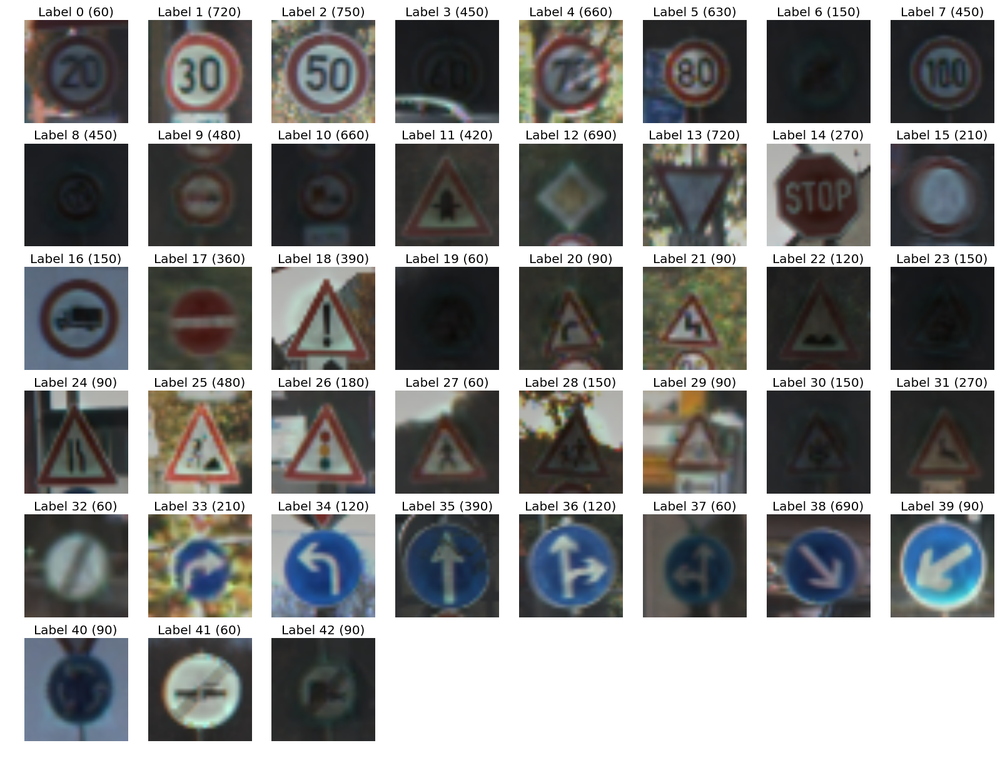

In [92]:
test_mean_img = np.mean(X_test, axis=0)
test_std_img = np.std(X_test, axis=0)
test_norm_imgs = (X_test - test_mean_img)/test_std_img

print(test_norm_imgs.shape)

plt.imshow(test_norm_imgs[0])

test_norm_imgs_show = (test_norm_imgs - np.min(test_norm_imgs)) / (np.max(test_norm_imgs) - np.min(test_norm_imgs))

testlbl = y_test.tolist()
display_images_and_labels(test_norm_imgs_show, testlbl, "testset.png")

In [93]:
# Run predictions against the full test set.
predicted1 = session.run([predicted_labels], 
                        feed_dict={images_ph: test_norm_imgs})[0]
# Calculate how many matches we got.
match_count1 = sum([int(y == y_) for y, y_ in zip(testlbl, predicted1)])
accuracy1 = match_count1 / len(testlbl)
print("Accuracy: {:.3f}".format(accuracy))

Accuracy: 0.883


Saving and Restoring from Checkpoints

In [94]:
# To Save Checkpoint:
with graph.as_default():
    saver = tf.train.Saver()
    
save_path = saver.save(session, "./model.ckpt")
print("Model saved in file: %s" % save_path)


#To Restore checkpoint:
"""
import os

sess = tf.Session()
init_op = tf.initialize_all_variables()
saver = tf.train.Saver()
sess.run(init_op)
if os.path.exists("model.ckpt"):
    saver.restore(sess, "model.ckpt")
    print("Model restored.")
""" ;
    

Model saved in file: ./model.ckpt


In [95]:
# Close the session. This will destroy the trained model.
session.close()

### Question 7

_Is your model able to perform equally well on captured pictures or a live camera stream when compared to testing on the dataset?_


**Answer:** No :(

In [ ]:
### Visualize the softmax probabilities here.
### Feel free to use as many code cells as needed.

### Question 8

*Use the model's softmax probabilities to visualize the **certainty** of its predictions, [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.11/api_docs/python/nn.html#top_k) could prove helpful here. Which predictions is the model certain of? Uncertain? If the model was incorrect in its initial prediction, does the correct prediction appear in the top k? (k should be 5 at most)*


**Answer:** Not sure..

### Question 9
_If necessary, provide documentation for how an interface was built for your model to load and classify newly-acquired images._


**Answer:**
Downloaded jpeg images into a local folder and used the above scripts to load, crop and pass it thru prediction filter.

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.